https://github.com/mas178/Inaba2024/blob/d1a5dda1310e5de07e7bc2884e45de44873cc034/src/Simulation.jl
を再現する → 再現できた。

- (0.0, 0.0), (0.1, 0.1) のときは50%前後の協力率
- (0.8, 0.8), (0.9, 0.9) のときは70%以上の協力率

人口変動をよりシンプルにする。

In [1]:
using DataFrames: DataFrame, nrow, dropmissing, select!, Not
using Graphs: SimpleGraph, degree, gdistances, local_clustering_coefficient, connected_components
using LinearAlgebra
using Random: MersenneTwister
using StatsBase: mean, std, sample, Weights, describe
using Plots: plot, plot!, Plot

Threads.nthreads()

12

Summary Stats:
Length:         10001
Missing Count:  0
Mean:           996.970303
Minimum:        700.000000
1st Quartile:   700.000000
Median:         700.000000
3rd Quartile:   1300.000000
Maximum:        1300.000000
Type:           Int64
Summary Stats:
Length:         10001
Missing Count:  0
Mean:           2559.904010
Minimum:        100.000000
1st Quartile:   100.000000
Median:         100.000000
3rd Quartile:   5000.000000
Maximum:        10000.000000
Type:           Int64
Summary Stats:
Length:         10001
Missing Count:  0
Mean:           1000.000000
Minimum:        1000.000000
1st Quartile:   1000.000000
Median:         1000.000000
3rd Quartile:   1000.000000
Maximum:        1000.000000
Type:           Int64
Summary Stats:
Length:         10001
Missing Count:  0
Mean:           100.000000
Minimum:        100.000000
1st Quartile:   100.000000
Median:         100.000000
3rd Quartile:   100.000000
Maximum:        100.000000
Type:           Int64
Summary Stats:
Length:         1

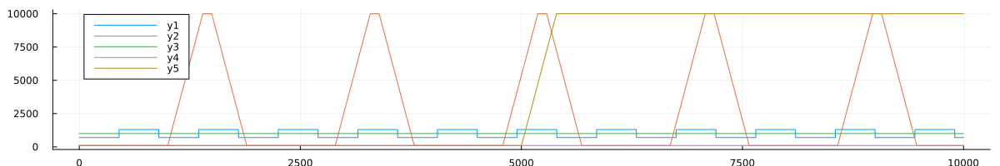

In [2]:
"""
expectation:`e`、amplitude:`a`、wavelength:`λ`、time steps:`t_max`の2準位の波`Vector{Int}`を返す。
"""
function two_level_spiked_N_vec(e::Int, a::Int, λ::Int, t_max::Int)::Vector{Int}
    (λ == 0) && return fill(e, t_max)
    
    r = 1 - a / e

    [x % λ < round(Int, λ * (1 - r)) ? round(Int, e * r) : round(Int, e / r) for x in 1:t_max]
end

"""
expectation:`e`、amplitude:`a`、wavelength:`λ`、time steps:`t_max`の2準位の波`Vector{Int}`を返す。
"""
function two_level_N_vec(e::Int, a::Int, λ::Int, t_max::Int)::Vector{Int}
    (a == 0 || λ == 0) && return fill(e, t_max)

    e .+ a .* [((x - 1) % λ) < (λ / 2) ?  -1 : 1 for x in 1:t_max]
end

Nₑ = 1_000
t_max = 10_001
N_vec_std = two_level_N_vec(Nₑ, 300, 900, t_max)
N_vec_spike = repeat([fill(100, 1_000); collect(100:25:10_000); fill(10_000, 100); collect(10_000:-25:100)], 6)[1:t_max]
N_vec_flat1000 = fill(Nₑ, t_max)
N_vec_flat100 = fill(Int(Nₑ / 10), t_max)
N_vec_2phase = [fill(100, round(Int, t_max / 2)); collect(100:25:10_000); fill(10_000, round(Int, t_max / 2) - length(collect(100:25:10_000)) + 1)]
N_vec_vec = [N_vec_std, N_vec_spike, N_vec_flat1000, N_vec_flat100, N_vec_2phase]

p = plot(size = (1200, 200))
for N_vec in N_vec_vec
    describe(N_vec)
    plot!(N_vec)
end
display(p)

In [3]:
@enum Strategy C D

invert(s::Strategy)::Strategy = (s == C ? D : C)

@kwdef struct Param
    T::Float64 = 1.15                        # Temptation payoff
    S::Float64 = -0.15                       # Sucker's payoff
    initial_graph_weight::Float64 = 0.2
    relationship_volatility::Float64 = 0.1
    reproduction_rate::Float64 = 0.05
    δ::Float64 = 1.0                         # strength of selection
    μ::Float64 = 0.01                        # mutation rate
    t_max::Int = 10_000                       # generations (Time steps)
    trial_max::Int = 10                      # trial count
    rng::MersenneTwister = MersenneTwister() # random seed
end

mutable struct Model
    param::Param
    N_vec::Vector{Int}
    payoff_table::Dict{Tuple{Strategy,Strategy},Tuple{Float64,Float64}}
    strategy_vec::Vector{Strategy}     # agents' strategy
    payoff_vec::Vector{Float64}        # agents' payoff
    graph_weights::Matrix{Float16}     # agents' relationship

    function Model(p::Param, N_vec::Vector{Int})
        N₁ = N_vec[1]

        new(
            p,
            N_vec,
            Dict((C, C) => (1.0, 1.0), (C, D) => (p.S, p.T), (D, C) => (p.T, p.S), (D, D) => (0.0, 0.0)),
            rand(p.rng, [C, D], N₁),
            fill(0.0, N₁),
            (fill(1.0, (N₁, N₁)) - Matrix(I, N₁, N₁)) * p.initial_graph_weight,
        )
    end
end

function interaction!(model::Model, t::Int = -1)::Nothing
    focal_id_vec = collect(1:model.N_vec[t])
    update_weights = fill(Float16(1.0), (model.N_vec[t], model.N_vec[t]))

    @inbounds for focal_id in focal_id_vec
        opponent_id = sample(model.param.rng, focal_id_vec, Weights(model.graph_weights[focal_id, :]))

        strategy_pair = (model.strategy_vec[focal_id], model.strategy_vec[opponent_id])

        # Update payoff
        focal_payoff, opponent_payoff = model.payoff_table[strategy_pair]
        model.payoff_vec[focal_id] += focal_payoff
        model.payoff_vec[opponent_id] += opponent_payoff

        # for updating relationships
        increment = model.param.relationship_volatility * (strategy_pair == (C, C) ? 1 : -1)
        update_weights[focal_id, opponent_id] = update_weights[opponent_id, focal_id] *= (1.0 + increment)
    end

    # Update relationships
    model.graph_weights = min.(model.graph_weights .* update_weights, 1.0)

    return
end

sigmoid_fitness(payoff::Float64, δ::Float64)::Float64 = 1.0 / (1.0 + exp(-δ * payoff))

function pick_agents_by_fitness(model::Model, n::Int, select_for::Symbol)::Vector{Int}
    fitness_vec = if select_for == :death
        sigmoid_fitness.(-model.payoff_vec, model.param.δ)
    elseif select_for == :birth
        sigmoid_fitness.(model.payoff_vec, model.param.δ)
    else
        error("Invalid selection criteria: $(select_for). Use :death or :birth.")
    end

    agent_id_vec = try
        sample(model.param.rng, 1:length(fitness_vec), Weights(fitness_vec), n, replace = n > length(fitness_vec))
    catch e
        @show n, fitness_vec
        error(e)
    end
    
    return sort(agent_id_vec)
end


function normalize_graph_weights!(graph_weights::Matrix{Float16}, N::Int, initial_graph_weight::Float64)::Nothing
    initial_graph_weight_sum = N * (N - 1) * initial_graph_weight

    # factor = sum(Float64.(graph_weights))
    factor = 0.0
    @inbounds @simd for weight in graph_weights
        factor += Float64(weight)
    end

    # graph_weights ./= (factor / initial_graph_weight_sum)
    factor = Float16(initial_graph_weight_sum / factor)
    @inbounds @simd for i in eachindex(graph_weights)
        graph_weights[i] *= factor
    end

    return
end

function death_and_birth!(model::Model, t::Int = -1)::Tuple{Vector{Int},Vector{Int}}
    n_death = n_birth = round(Int, model.N_vec[t] * model.param.reproduction_rate)
    n_growth = model.N_vec[t + 1] - model.N_vec[t]
    if n_growth > 0
        n_birth += n_growth
    elseif n_growth < 0
        n_death += abs(n_growth)
    end

    death_id_vec = []
    parent_id_vec = []

    # death
    death_id_vec = pick_agents_by_fitness(model, n_death, :death)
    deleteat!(model.strategy_vec, death_id_vec)
    deleteat!(model.payoff_vec, death_id_vec)
    survived_index = deleteat!(collect(1:model.N_vec[t]), death_id_vec)
    model.graph_weights = model.graph_weights[survived_index, survived_index]

    # birth
    parent_id_vec = pick_agents_by_fitness(model, n_birth, :birth)
    mutation_vec = rand(model.param.rng, n_birth) .< model.param.μ

    for i = 1:n_birth
        # strategy
        parent_strategy = model.strategy_vec[parent_id_vec[i]]
        parent_strategy = mutation_vec[i] ? invert(parent_strategy) : parent_strategy
        push!(model.strategy_vec, parent_strategy)

        # payoff
        push!(model.payoff_vec, 0.0)
    end

    _new_weights = fill(Float16(0.0), (model.N_vec[t + 1], model.N_vec[t + 1]))
    @inbounds for x = 1:(model.N_vec[t + 1] - n_birth)
        @simd for y = 1:(model.N_vec[t + 1] - n_birth)
            _new_weights[x, y] = model.graph_weights[x, y]
        end
    end
    @inbounds @simd for i = 1:n_birth
        _new_weights[model.N_vec[t + 1] - n_birth + i, :] = _new_weights[parent_id_vec[i], :]
        _new_weights[:, model.N_vec[t + 1] - n_birth + i] = _new_weights[:, parent_id_vec[i]]
        _new_weights[parent_id_vec[i], model.N_vec[t + 1] - n_birth + i] = 1.0
        _new_weights[model.N_vec[t + 1] - n_birth + i, parent_id_vec[i]] = 1.0
        _new_weights[model.N_vec[t + 1] - n_birth + i, model.N_vec[t + 1] - n_birth + i] = 0.0
    end
    model.graph_weights = _new_weights

    normalize_graph_weights!(model.graph_weights, model.N_vec[t + 1], model.param.initial_graph_weight)

    return death_id_vec, parent_id_vec
end

cooperation_rate(model::Model)::Float64 = sum(model.strategy_vec .== C) / length(model.strategy_vec)

function run_one_step!(model::Model, t::Int)::Nothing
    model.payoff_vec .= 0.0
    interaction!(model, t)
    death_and_birth!(model, t)
    return
end

function run(param::Param, N_vec::Vector{Int})::Matrix{Float64}
    cooperation_rate_matrix = fill(0.0, param.t_max, param.trial_max)

    for trial in 1:param.trial_max
        model = Model(param, N_vec)
        
        for t = 1:(model.param.t_max)
            run_one_step!(model, t)
            cooperation_rate_matrix[t, trial] = cooperation_rate(model)
        end
    end

    return cooperation_rate_matrix
end

function plot_time_series(cooperation_rate_matrix::Matrix{Float64}, N_vec::Vector{Int}, title = "")::Plot
    t_max, trial_max = size(cooperation_rate_matrix)

    p = plot(size = (1000, 300), xlim = (0, t_max), xticks = 0:500:t_max, ylim = (0, 1), yticks = 0:0.1:1, legend = false, title = title)
    
    for trial in 1:trial_max
        plot!(cooperation_rate_matrix[:, trial])
    end
    
    plot!(mean(cooperation_rate_matrix, dims=2), lc = :black, lw = 3)
    
    p_N_vec = plot(N_vec, size = (1000, 100), xlim = (0, t_max), xticks = 0:500:t_max, legend = false, title = "Population")
    
    return plot(p_N_vec, p, layout = (2, 1))
end;

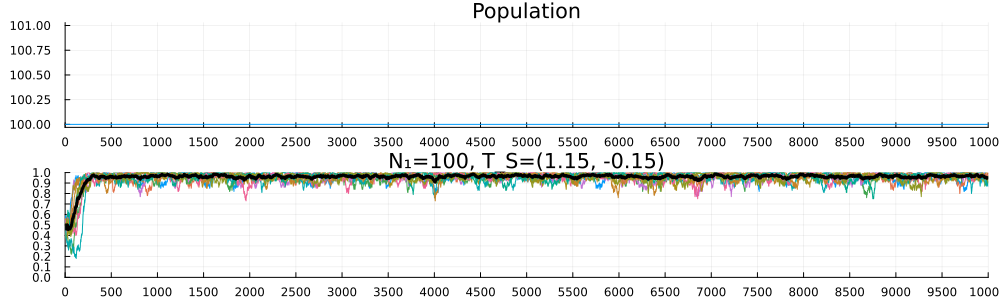

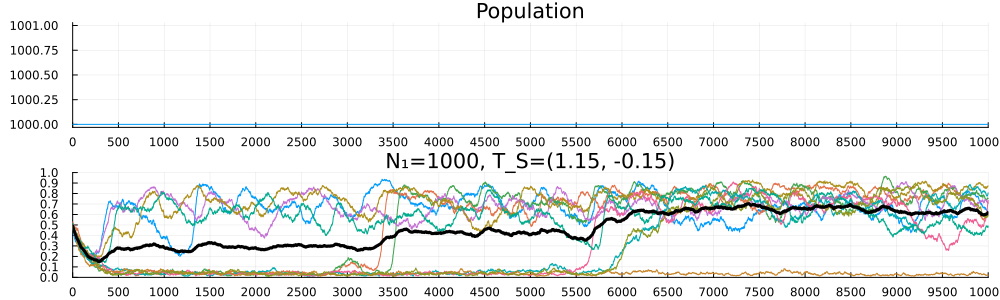

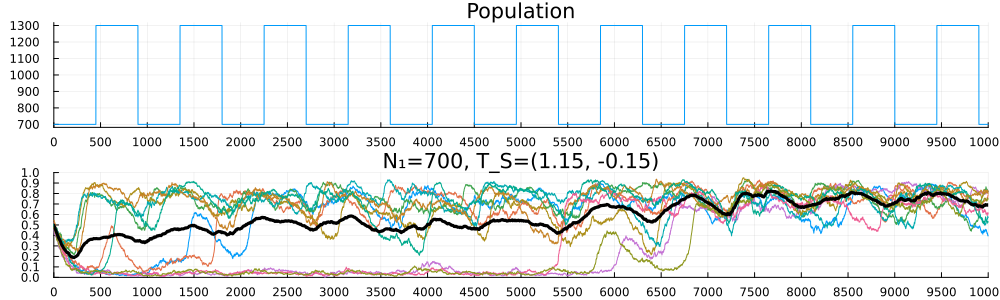

In [ ]:
Threads.@threads for N_vec in N_vec_vec
    param = Param()
    cooperation_rate_matrix = run(param, N_vec)
    title = "N₁=$(N_vec[1]), T_S=$((param.T, param.S))"
    display(plot_time_series(cooperation_rate_matrix, N_vec, title))
end;